In [1]:
# Import libraries

import numpy as np
import pandas as pd
from pandas_datareader import data
import plotly.express as px
import datetime
import plotly.graph_objects as go
import plotly.io as pio
from datetime import timedelta
from MCForecastTools import MCSimulation
from IPython.display import display

In [2]:
# Import Variables
%store -r stocks
%store -r benchmark
%store -r start_date
%store -r end_date
%store -r out_sample_days_held_back
%store -r theme
%store -r number_opt_porfolios
%store -r rf
%store -r number_simulation
%store -r years
%store -r init_investment
seed=42
np.random.seed(seed)
%store -r benchmark_returns
%store -r benchmark_returns_excl_ly
%store -r cumulative_benchmark_returns
%store -r last_year_benchmark_returns
%store -r one_year_benchmark_returns
%store -r port_returns
%store -r optimal_risky_port
%store -r one_year_port_returns
%store -r optimal_cumulative_returns
%store -r one_year_cumulative_returns
%store -r bm_annual_returns
%store -r bm_annual_std_dev
%store -r bm_sharpe
%store -r yrs_full
%store -r yrs
%store -r port_returns_sample
%store -r optimal_cumulative_returns_sample
%store -r optimal_risky_port_sample
%store -r bm_annual_returns_sample
%store -r bm_annual_std_dev_sample
%store -r bm_sharpe_sample

## 1. Complete Data vs Benchmark

### Cumulative Historical Returns: Optimal Portfolio vs. Benchmark

In [3]:
# Concatenate the optimal and benchmark daily returns

historic_daily_returns = pd.concat([benchmark_returns, port_returns], axis=1, join="inner")

historic_daily_returns['Date'] = historic_daily_returns.index
historic_daily_returns['Date'] = historic_daily_returns['Date'].dt.date

In [4]:
#Here we concatenate the historical optimal cumulative portfolio returns with that of the benchmark

historic_returns = pd.concat([cumulative_benchmark_returns, optimal_cumulative_returns], axis=1, join="inner")

historic_returns['Date'] = historic_returns.index
historic_returns['Date'] = historic_returns['Date'].dt.date
historic_returns

,BM_Returns,Portfolio_returns,Date
Date,,,
2008-01-02,1.000000,1.000000,2008-01-02
2008-01-03,1.000978,0.999856,2008-01-03
2008-01-04,0.981311,0.951072,2008-01-04
2008-01-07,0.983405,0.951218,2008-01-07
2008-01-08,0.965126,0.927005,2008-01-08
...,...,...,...
2022-09-26,2.243246,18.801200,2022-09-26
2022-09-27,2.233600,18.858616,2022-09-27
2022-09-28,2.275669,18.841416,2022-09-28


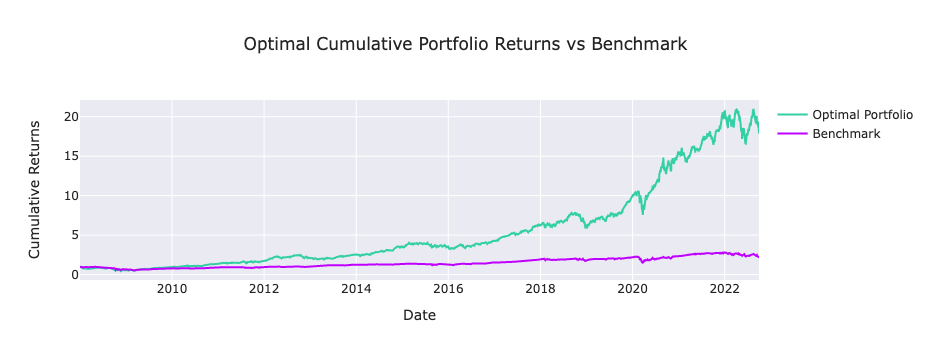

In [5]:
# Cumulative Historical Returns: Optimal Porfolio vs. Benchmark

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=historic_returns['Date'],
        y=historic_returns['Portfolio_returns'],
        name="Optimal Portfolio",
        line=dict(color="#33CFA5")
    ))

fig.add_trace(
    go.Scatter(
        x=historic_returns['Date'],
        y=historic_returns['BM_Returns'],
        name='Benchmark',
        line=dict(color="#bf00ff")
    ))


fig.update_layout(
    title={
        'text': "Optimal Cumulative Portfolio Returns vs Benchmark",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Date'),
    yaxis=dict(autorange=True,
              title_text='Cumulative Returns')
)

fig.show()

### Descriptive Statistics of Portfolio Historic Returns vs Benchmark

In [6]:
# Descriptive Statistics
# historic_daily_returns
# historic_returns

pm_start = init_investment
bm_start = init_investment

pm_end = round(init_investment * historic_returns['Portfolio_returns'][-1],2)
bm_end = round(init_investment * historic_returns['BM_Returns'][-1],2)

daily_pm_max_return = historic_daily_returns['Portfolio_returns'].max()
daily_bm_max_retrun = historic_daily_returns['BM_Returns'].max()

daily_pm_min_return = historic_daily_returns['Portfolio_returns'].min()
daily_bm_min_retrun = historic_daily_returns['BM_Returns'].min()

pm_return = optimal_risky_port[0]
bm_return = bm_annual_returns[0]

pm_vol = optimal_risky_port[1]
bm_vol = bm_annual_std_dev[0]

pm_sharpe = round(optimal_risky_port[-1],2)
bm_sharpe = round(bm_sharpe,2)

covariance = historic_daily_returns['Portfolio_returns'].cov(historic_daily_returns['BM_Returns'])
variance = historic_daily_returns['BM_Returns'].var()
pm_beta = round((covariance/variance),2)

bm_beta = 1

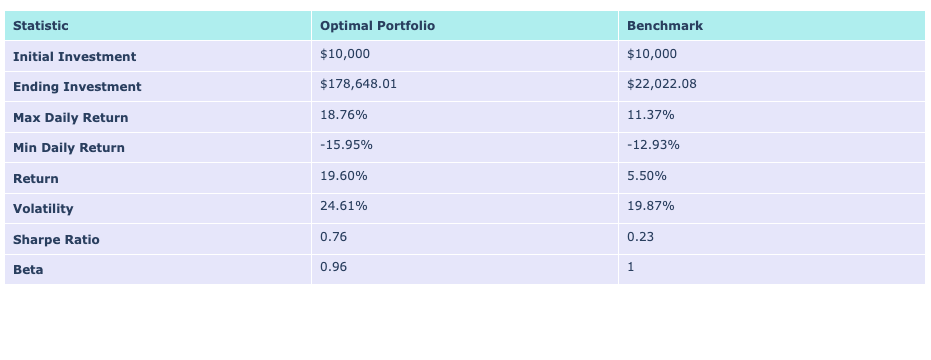

In [7]:
# Table of Descriptive Statistics

head = ['<b>Statistic<b>', '<b>Optimal Portfolio<b>', '<b>Benchmark<b>']
labels = ['<b>Initial Investment<b>', '<b>Ending Investment<b>', '<b>Max Daily Return<b>',
          '<b>Min Daily Return<b>', '<b>Return<b>', '<b>Volatility<b>', '<b>Sharpe Ratio<b>', '<b>Beta<b>']
pf_stats = ['${:,}'.format(pm_start), '${:,}'.format(pm_end), '{:.2%}'.format(daily_pm_max_return), 
            '{:.2%}'.format(daily_pm_min_return), '{:.2%}'.format(pm_return), '{:.2%}'.format(pm_vol), pm_sharpe, pm_beta]
bm_stats = ['${:,}'.format(bm_start),'${:,}'.format(bm_end), '{:.2%}'.format(daily_bm_max_retrun), 
            '{:.2%}'.format(daily_bm_min_retrun), '{:.2%}'.format(bm_return), '{:.2%}'.format(bm_vol), bm_sharpe, bm_beta]

fig = go.Figure(data=[go.Table(
    header=dict(values=head,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[labels, pf_stats, bm_stats],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(margin=dict(l=5, r=5, b=0,t=10))

fig.show()

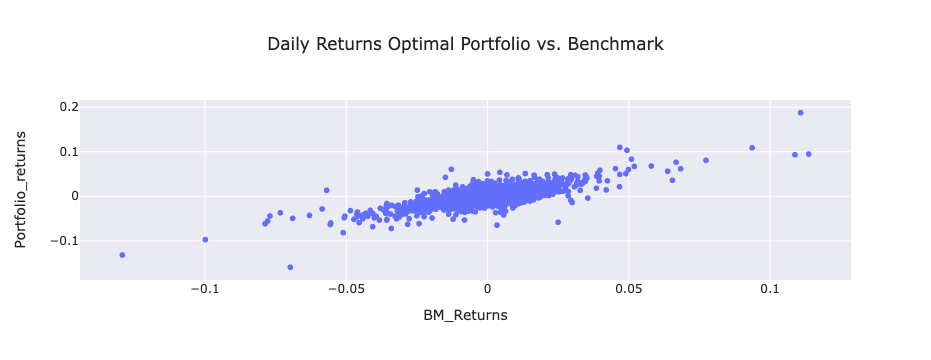

In [8]:
# Plot Daily Returns Optimal Portfolio vs. Benchmark

fig = px.scatter(historic_daily_returns, x='BM_Returns', y='Portfolio_returns', title='Daily Returns Optimal Portfolio vs. Benchmark')

fig.update_layout(template=theme)
fig.show()

## Sliced Dataframe vs benchmark

In [9]:
#Here we concatenate the historical optimal daily portfolio returns with that of the benchmark

sample_daily_historic_returns = pd.concat([benchmark_returns_excl_ly, port_returns_sample], axis=1, join="inner")
sample_daily_historic_returns['Date'] = sample_daily_historic_returns.index
sample_daily_historic_returns['Date'] = sample_daily_historic_returns['Date'].dt.date

In [10]:
#Here we concatenate the historical optimal cumulative portfolio returns with that of the benchmark

sample_cumulative_historic_returns = pd.concat([cumulative_benchmark_returns, optimal_cumulative_returns_sample], axis=1, join="inner")

sample_cumulative_historic_returns['Date'] = sample_cumulative_historic_returns.index
sample_cumulative_historic_returns['Date'] = sample_cumulative_historic_returns['Date'].dt.date

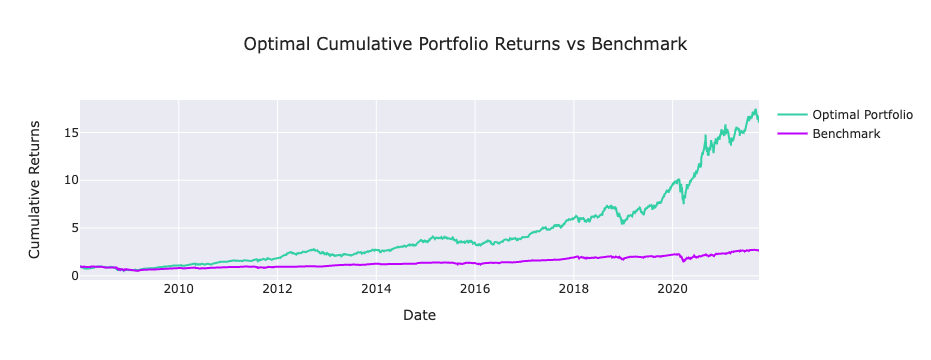

In [11]:
# Cumulative Historical Returns: Optimal Porfolio vs. Benchmark

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=sample_cumulative_historic_returns['Date'],
        y=sample_cumulative_historic_returns['Portfolio_returns'],
        name="Optimal Portfolio",
        line=dict(color="#33CFA5")
    ))

fig.add_trace(
    go.Scatter(
        x=sample_cumulative_historic_returns['Date'],
        y=sample_cumulative_historic_returns['BM_Returns'],
        name='Benchmark',
        line=dict(color="#bf00ff")
    ))


fig.update_layout(
    title={
        'text': "Optimal Cumulative Portfolio Returns vs Benchmark",
    },
    template=theme,
    xaxis=dict(autorange=True,
              title_text='Date'),
    yaxis=dict(autorange=True,
              title_text='Cumulative Returns')
)

fig.show()

In [12]:
# Descriptive Statistics - Sample Data
# sample_daily_historic_returns
# sample_cumulative_historic_returns

pm_start = init_investment
bm_start = init_investment

pm_end = round(init_investment * sample_cumulative_historic_returns['Portfolio_returns'][-1],2)
bm_end = round(init_investment * sample_cumulative_historic_returns['BM_Returns'][-1],2)

daily_pm_max_return = sample_daily_historic_returns['Portfolio_returns'].max()
daily_bm_max_return = sample_daily_historic_returns['BM_Returns'].max()

daily_pm_min_return = sample_daily_historic_returns['Portfolio_returns'].min()
daily_bm_min_return = sample_daily_historic_returns['BM_Returns'].min()

pm_return = optimal_risky_port_sample[0]
bm_return = bm_annual_returns_sample[0]

pm_vol = optimal_risky_port_sample[1]
bm_vol = bm_annual_std_dev_sample[0]

pm_sharpe = round(optimal_risky_port_sample[-1],2)
bm_sharpe = round(bm_sharpe_sample,2)

covariance = sample_daily_historic_returns['Portfolio_returns'].cov(sample_daily_historic_returns['BM_Returns'])
variance = sample_daily_historic_returns['BM_Returns'].var()
pm_beta = round((covariance/variance),2)

bm_beta = 1

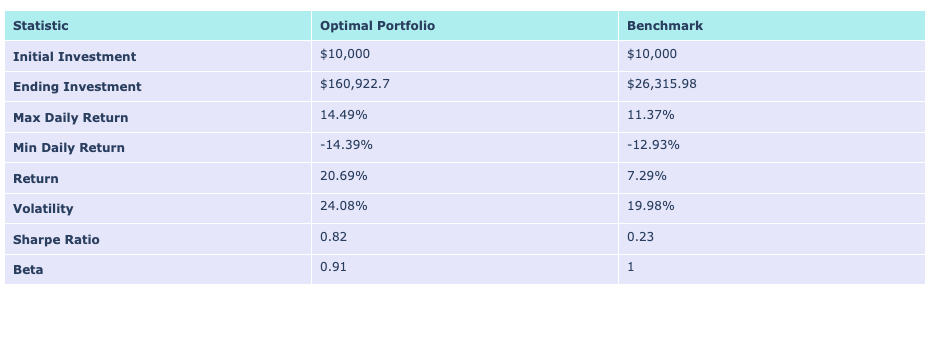

In [13]:
# Table of Descriptive Statistics - Sample Data

head = ['<b>Statistic<b>', '<b>Optimal Portfolio<b>', '<b>Benchmark<b>']
labels = ['<b>Initial Investment<b>', '<b>Ending Investment<b>', '<b>Max Daily Return<b>',
          '<b>Min Daily Return<b>', '<b>Return<b>', '<b>Volatility<b>', '<b>Sharpe Ratio<b>', '<b>Beta<b>']
pf_stats = ['${:,}'.format(pm_start), '${:,}'.format(pm_end), '{:.2%}'.format(daily_pm_max_return), 
            '{:.2%}'.format(daily_pm_min_return), '{:.2%}'.format(pm_return), '{:.2%}'.format(pm_vol), pm_sharpe, pm_beta]
bm_stats = ['${:,}'.format(bm_start), '${:,}'.format(bm_end), '{:.2%}'.format(daily_bm_max_return),
            '{:.2%}'.format(daily_bm_min_return), '{:.2%}'.format(bm_return), '{:.2%}'.format(bm_vol), bm_sharpe, bm_beta]

fig = go.Figure(data=[go.Table(
    header=dict(values=head,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[labels, pf_stats, bm_stats],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(margin=dict(l=5, r=5, b=0,t=10))

fig.show()

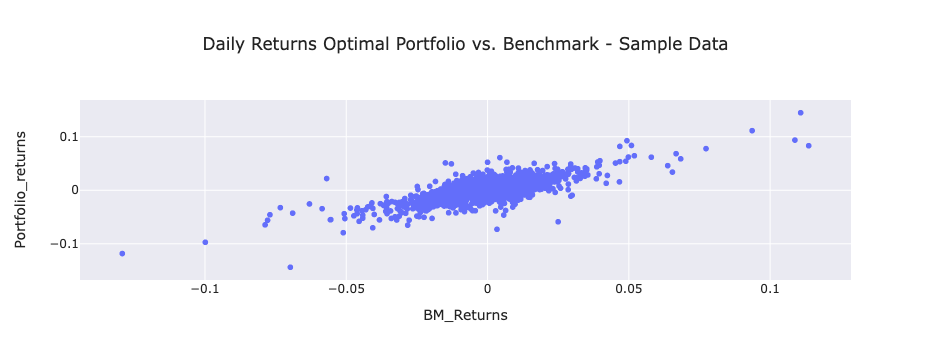

In [14]:
# Plot Daily Returns Optimal Portfolio vs. Benchmark - Sample Data

fig = px.scatter(sample_daily_historic_returns, x='BM_Returns', y='Portfolio_returns', 
                 title='Daily Returns Optimal Portfolio vs. Benchmark - Sample Data')

fig.update_layout(template=theme)
fig.show()

## Last Year vs Benchmark

In [15]:
# Concatenate the optimal and benchmark daily returns

one_year_historic_daily_returns = pd.concat([last_year_benchmark_returns, one_year_port_returns], axis=1, join="inner")

one_year_historic_daily_returns['Date'] = one_year_historic_daily_returns.index
one_year_historic_daily_returns['Date'] = one_year_historic_daily_returns['Date'].dt.date
one_year_historic_daily_returns

,BM_Returns,Portfolio_returns,Date
Date,,,
2021-10-04,-0.009425,-0.018991,2021-10-04
2021-10-05,0.009168,0.012511,2021-10-05
2021-10-06,0.002982,0.005950,2021-10-06
2021-10-07,0.009819,0.011722,2021-10-07
2021-10-08,-0.000250,0.000113,2021-10-08
...,...,...,...
2022-09-26,-0.011139,0.001887,2022-09-26
2022-09-27,-0.004300,0.003206,2022-09-27
2022-09-28,0.018835,-0.001593,2022-09-28


In [16]:
# Concatenate the optimal and benchmark cumulative returns

one_year_historic_returns = pd.concat([one_year_benchmark_returns, one_year_cumulative_returns], axis=1, join="inner")

one_year_historic_returns['Date'] = one_year_historic_returns.index
one_year_historic_returns['Date'] = one_year_historic_returns['Date'].dt.date
one_year_historic_returns

,BM_Returns,Portfolio_returns,Date
Date,,,
2021-10-03,1.000000,1.000000,2021-10-03
2021-10-04,0.990575,0.981009,2021-10-04
2021-10-05,0.999657,0.993282,2021-10-05
2021-10-06,1.002637,0.999193,2021-10-06
2021-10-07,1.012483,1.010906,2021-10-07
...,...,...,...
2022-09-26,0.852427,1.068208,2022-09-26
2022-09-27,0.848762,1.071633,2022-09-27
2022-09-28,0.864748,1.069926,2022-09-28


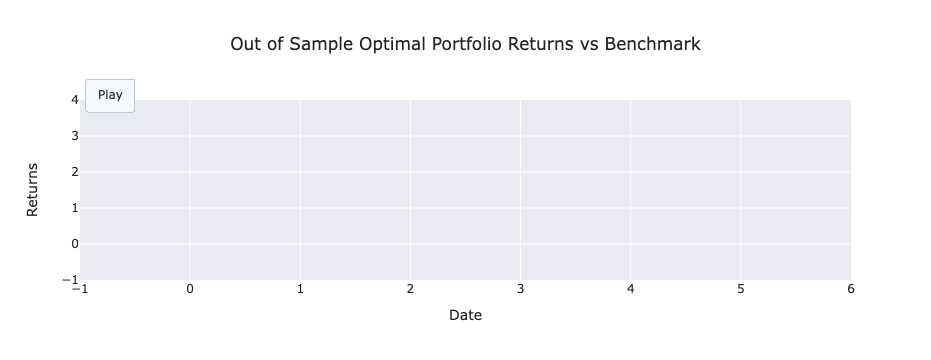

In [17]:
# Plot An animated graphs of the optimal vs. Benchmark cumulative returns

fig = go.Figure(
    layout=go.Layout(
        updatemenus=[dict(type="buttons", direction="left", x=0.07, y=1.125), ],
        xaxis=dict(autorange=True, 
                   title_text="Date"),
        yaxis=dict(autorange=True,
                   title_text="Returns"),
        title="Out of Sample Optimal Portfolio Returns vs Benchmark",
    ))

# Add traces
init = 0


fig.add_trace(
    go.Scatter(
        x=one_year_historic_returns['Date'][:init],
        y=one_year_historic_returns['Portfolio_returns'][:init],
        name='Optimal Portfolio Returns',
        line=dict(color="#33CFA5")
    ))


fig.add_trace(
    go.Scatter(
        x=one_year_historic_returns['Date'][:init],
        y=one_year_historic_returns['BM_Returns'][:init],
        name='Benchmark Returns',
        line=dict(color="#bf00ff")
    ))


# Animation
fig.update(frames=[
    go.Frame(
        data=[
            go.Scatter(x=one_year_historic_returns['Date'][:k], y=one_year_historic_returns['Portfolio_returns'][:k]),
            go.Scatter(x=one_year_historic_returns['Date'][:k], y=one_year_historic_returns['BM_Returns'][:k])]
            
    )
    for k in range(init, one_year_historic_returns.shape[0]+1)])



# Buttons
fig.update_layout(
    template=theme,
    updatemenus=[
        dict(
            buttons=list([
                dict(label="Play",
                     method="animate",
                    args=[None, {"frame": {"duration": 1}}])
            ]))])


fig.show()

In [18]:
# Descriptive Statistics - Out of Sample Data
# one_year_historic_daily_returns
# one_year_historic_returns

pm_start = init_investment
bm_start = init_investment

pm_end = round(init_investment * one_year_historic_returns['Portfolio_returns'][-1],2)
bm_end = round(init_investment * one_year_historic_returns['BM_Returns'][-1],2)

daily_pm_max_return = one_year_historic_daily_returns['Portfolio_returns'].max()
daily_bm_max_retrun = one_year_historic_daily_returns['BM_Returns'].max()

daily_pm_min_return = one_year_historic_daily_returns['Portfolio_returns'].min()
daily_bm_min_retrun = one_year_historic_daily_returns['BM_Returns'].min()

one_yr = yrs_full - yrs

pm_return = one_year_historic_daily_returns['Portfolio_returns'].apply(lambda x: (1+x)).cumprod().iloc[-1]**(1/one_yr) - 1
bm_return = one_year_historic_daily_returns['BM_Returns'].apply(lambda x: (1+x)).cumprod().iloc[-1]**(1/one_yr) - 1

pm_vol = one_year_historic_daily_returns['Portfolio_returns'].apply(lambda x: np.log(1+x)).std()*np.sqrt(252)
bm_vol = one_year_historic_daily_returns['BM_Returns'].apply(lambda x: np.log(1+x)).std()*np.sqrt(252)

pm_sharpe = round((pm_return-rf)/pm_vol,2)
bm_sharpe = round((bm_return-rf)/bm_vol,2)

covariance = one_year_historic_daily_returns['Portfolio_returns'].cov(one_year_historic_daily_returns['BM_Returns'])
variance = one_year_historic_daily_returns['BM_Returns'].var()
pm_beta = round((covariance/variance),2)

bm_beta = 1

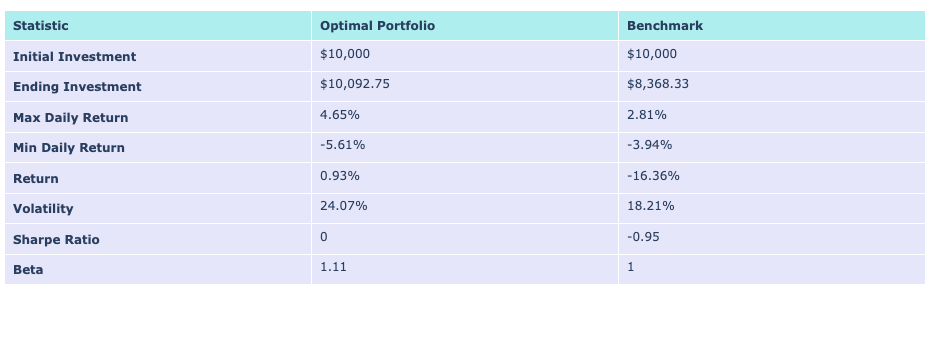

In [19]:
# Table of Descriptive Statistics - Sample Data

head = ['<b>Statistic<b>', '<b>Optimal Portfolio<b>', '<b>Benchmark<b>']
labels = ['<b>Initial Investment<b>', '<b>Ending Investment<b>', '<b>Max Daily Return<b>',
          '<b>Min Daily Return<b>', '<b>Return<b>', '<b>Volatility<b>', '<b>Sharpe Ratio<b>', '<b>Beta<b>']
pf_stats = ['${:,}'.format(pm_start), '${:,}'.format(pm_end), '{:.2%}'.format(daily_pm_max_return), 
            '{:.2%}'.format(daily_pm_min_return), '{:.2%}'.format(pm_return), '{:.2%}'.format(pm_vol), pm_sharpe, pm_beta]
bm_stats = ['${:,}'.format(bm_start), '${:,}'.format(bm_end), '{:.2%}'.format(daily_bm_max_retrun), 
            '{:.2%}'.format(daily_bm_min_retrun), '{:.2%}'.format(bm_return), '{:.2%}'.format(bm_vol), bm_sharpe, bm_beta]

fig = go.Figure(data=[go.Table(
    header=dict(values=head,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[labels, pf_stats, bm_stats],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(margin=dict(l=5, r=5, b=0,t=10))

fig.show()

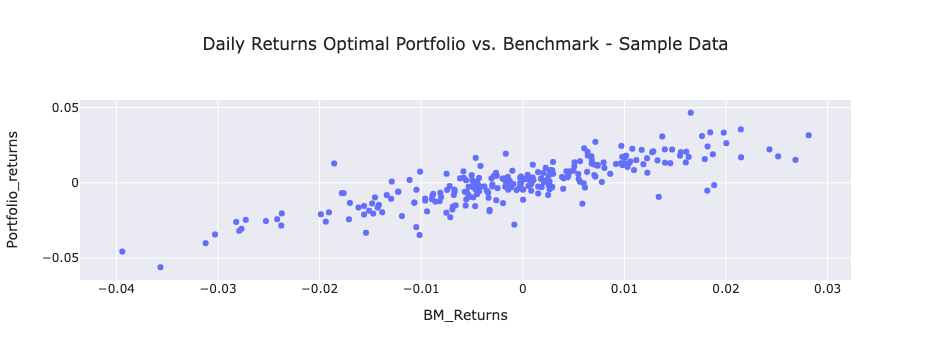

In [20]:
# Plot Daily Returns Optimal Portfolio vs. Benchmark - Out of Sample Data

fig = px.scatter(one_year_historic_daily_returns, x='BM_Returns', y='Portfolio_returns', 
                 title='Daily Returns Optimal Portfolio vs. Benchmark - Sample Data')

fig.update_layout(template=theme)
fig.show()